In [1]:
from __future__ import division
%pylab inline
figsize(14,8)

Populating the interactive namespace from numpy and matplotlib


In [2]:
from pywt import *
from scipy.io import wavfile
from IPython.lib.display import Audio
from scipy.signal import fftconvolve

In [3]:
print families()
print wavelist()

['haar', 'db', 'sym', 'coif', 'bior', 'rbio', 'dmey']
['bior1.1', 'bior1.3', 'bior1.5', 'bior2.2', 'bior2.4', 'bior2.6', 'bior2.8', 'bior3.1', 'bior3.3', 'bior3.5', 'bior3.7', 'bior3.9', 'bior4.4', 'bior5.5', 'bior6.8', 'coif1', 'coif2', 'coif3', 'coif4', 'coif5', 'db1', 'db2', 'db3', 'db4', 'db5', 'db6', 'db7', 'db8', 'db9', 'db10', 'db11', 'db12', 'db13', 'db14', 'db15', 'db16', 'db17', 'db18', 'db19', 'db20', 'dmey', 'haar', 'rbio1.1', 'rbio1.3', 'rbio1.5', 'rbio2.2', 'rbio2.4', 'rbio2.6', 'rbio2.8', 'rbio3.1', 'rbio3.3', 'rbio3.5', 'rbio3.7', 'rbio3.9', 'rbio4.4', 'rbio5.5', 'rbio6.8', 'sym2', 'sym3', 'sym4', 'sym5', 'sym6', 'sym7', 'sym8', 'sym9', 'sym10', 'sym11', 'sym12', 'sym13', 'sym14', 'sym15', 'sym16', 'sym17', 'sym18', 'sym19', 'sym20']


/Users/scheibler/anaconda/lib/python2.7/site-packages/matplotlib/axes/_subplots.py:69: MatplotlibDeprecationWarning: The use of 0 (which ends up being the _last_ sub-plot) is deprecated in 1.4 and will raise an error in 1.5
  mplDeprecation)


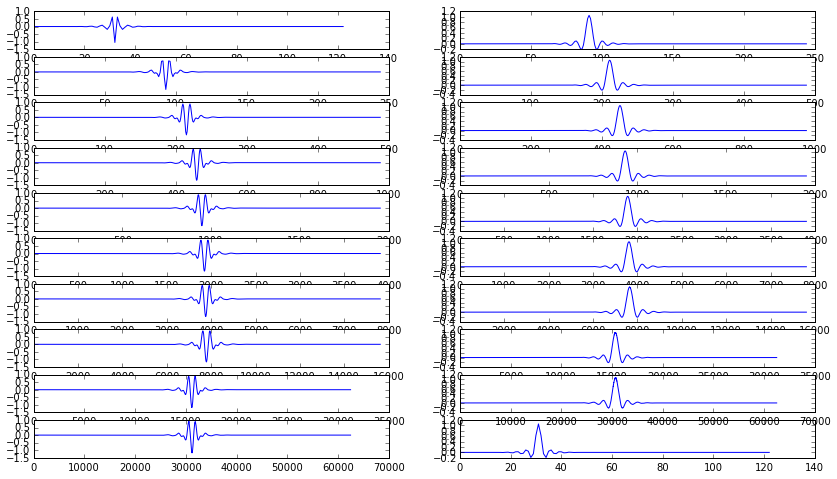

In [4]:
# Plotting some Daubechies wavelet functions with different widths
wavelet = Wavelet('dmey')

J = 10
for i in range(J):
    phi, psi, x = wavelet.wavefun(level=i+1)
    plt.subplot(J,2,2*i)
    plt.plot(phi)
    plt.subplot(J,2,2*i+1)
    plt.plot(psi)

In [5]:
r,s = wavfile.read('china_blast.wav')
print 'rate',r

rate 44100


/Users/scheibler/anaconda/lib/python2.7/site-packages/scipy/io/wavfile.py:172: WavFileWarning: Chunk (non-data) not understood, skipping it.
  WavFileWarning)


In [6]:
def cwt(s, fil='dmey', level=3):
    coeffs = [s]
    wav = Wavelet(fil)
    for i in xrange(level):
        phi, psi, x = wav.wavefun(level=i+1)
        
#         plt.figure()
#         plt.subplot(1,2,1)
#         Phi = np.abs(np.fft.rfft(phi))
#         plt.plot(np.linspace(0,0.5, Phi.shape[0]), Phi)
#         plt.title('\phi - level '+str(i+1))
#         plt.subplot(1,2,2)
#         Psi = np.abs(np.fft.rfft(psi))
#         plt.plot(np.linspace(0,0.5, Psi.shape[0]), Psi)
#         plt.title('\psi - level '+str(i+1))
        
        z = coeffs[i].copy()
        coeffs[i] = fftconvolve(z, psi, mode='same')
        coeffs.append(fftconvolve(z, phi, mode='same'))
    return coeffs

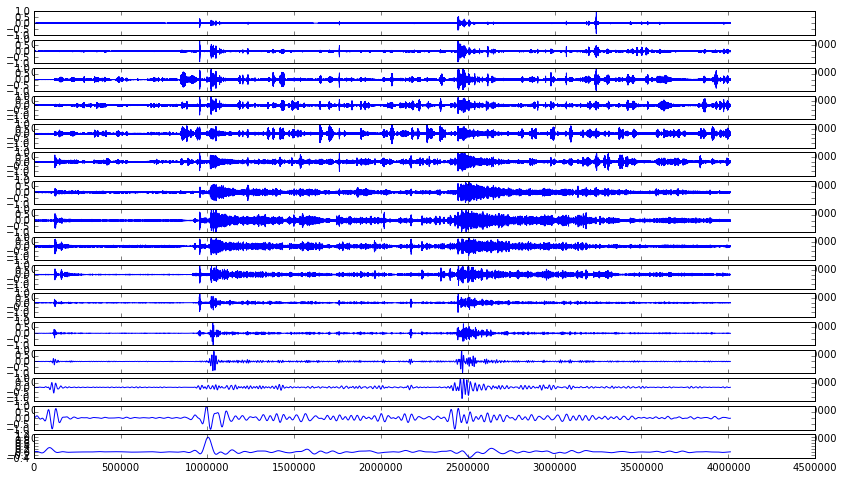

In [9]:
# 3 level decomposition of the speech signal
coeffs = wavedec(s[:,0], 'dmey', level=3)
coeffs = cwt(s[:,0], 'dmey', level=15)

for c in coeffs:
    c /= c.max()

plt.figure()
for i in range(len(coeffs)):
    plt.subplot(len(coeffs),1,i+1)
    plt.plot(coeffs[i])

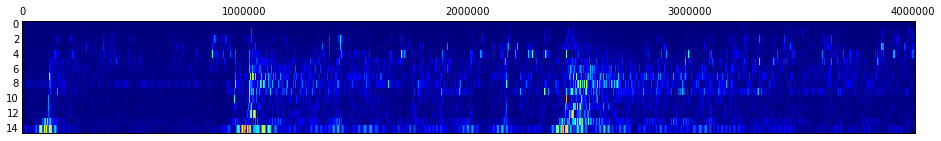

In [10]:
c = np.array(coeffs)
plt.matshow(np.abs(c[:15,:]), aspect='auto')

In [11]:
Audio(c[5,:], rate=r)

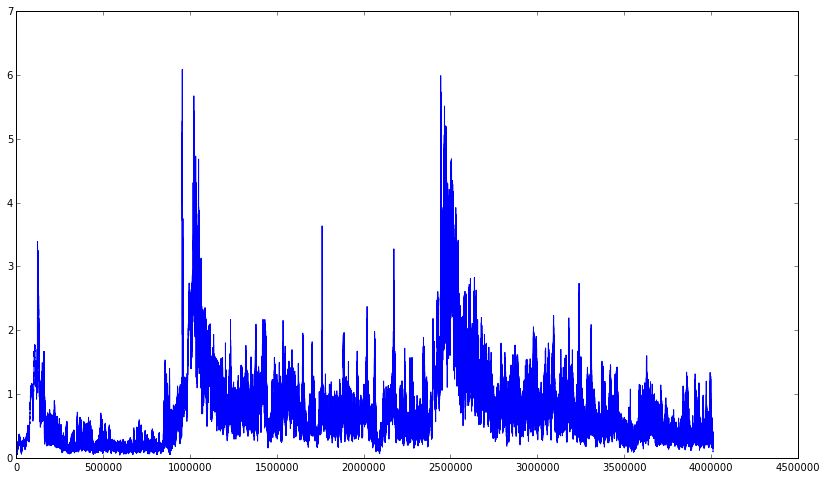

In [13]:
plot(np.abs(c[:,:]).sum(axis=0))